Mindset

Evaluation will be kept lenient, so make sure you attempt this case study.
Read the question carefully and try to understand what exactly is being asked.
Brainstorm a little. If you’re getting an error, remember that Google is your best friend.
You can watch the lecture recordings or go through your lecture notes once again if you feel like you’re getting confused over some specific topics.
Discuss your problems with your peers. Make use of the Slack channel and WhatsApp group.
Only if you think that there’s a major issue, you can reach out to your Instructor via Slack or Email.
There is no right or wrong answer. We have to get used to dealing with uncertainty in business. This is exactly the skill we want to develop.
Context

Jamboree has helped thousands of students like you make it to top colleges abroad. Be it GMAT, GRE or SAT, their unique problem-solving methods ensure maximum scores with minimum effort.
They recently launched a feature where students/learners can come to their website and check their probability of getting into the IVY league college. This feature estimates the chances of graduate admission from an Indian perspective.

How can you help here?

Your analysis will help Jamboree in understanding what factors are important in graduate admissions and how these factors are interrelated among themselves. It will also help predict one's chances of admission given the rest of the variables.

Dataset:

Dataset Link: jamboree_admission.csv

Column Profiling:

Serial No. (Unique row ID)
GRE Scores (out of 340)
TOEFL Scores (out of 120)
University Rating (out of 5)
Statement of Purpose and Letter of Recommendation Strength (out of 5)
Undergraduate GPA (out of 10)
Research Experience (either 0 or 1)
Chance of Admit (ranging from 0 to 1)
Concept Used:

Exploratory Data Analysis
Linear Regression
What does good looks like?

Import the dataset and do usual exploratory data analysis steps like checking the structure & characteristics of the dataset.
Drop the unique row Identifier if you see any. This step is important as you don’t want your model to build some understanding based on row numbers.
Use Non-graphical and graphical analysis for getting inferences about variables.
This can be done by checking the distribution of variables of graduate applicants.
Once you’ve ensured that students with varied merit apply for the university, you can start understanding the relationship between different factors responsible for graduate admissions.
Check correlation among independent variables and how they interact with each other.
Use Linear Regression from (Statsmodel library) and explain the results.
Test the assumptions of linear regression:
Multicollinearity check by VIF score
Mean of residuals
Linearity of variables (no pattern in residual plot)
Test for Homoscedasticity
Normality of residuals
Do model evaluation- MAE, RMSE, R2 score, Adjusted R2.
Provide actionable Insights & Recommendations
Try out different Linear Regressions
Evaluation Criteria (100 Points):

Define Problem Statement and perform Exploratory Data Analysis (10 points)
Definition of problem (as per given problem statement with additional views)
Observations on shape of data, data types of all the attributes, conversion of categorical attributes to 'category' (If required) , missing value detection, statistical summary.
Univariate Analysis (distribution plots of all the continuous variable(s) barplots/countplots of all the categorical variables)
Bivariate Analysis (Relationships between important variables such as workday and count, season and count, weather and count.
Illustrate the insights based on EDA
Comments on range of attributes, outliers of various attributes
Comments on the distribution of the variables and relationship between them
Comments for each univariate and bivariate plots
Data Preprocessing (10 Points)
Duplicate value check
Missing value treatment
Outlier treatment
Feature engineering
Data preparation for modeling
Model building (10 Points)
Build the Linear Regression model and comment on the model statistics
Display model coefficients with column names
Try out Ridge and Lasso regression
Testing the assumptions of the linear regression model (50 Points)
Multicollinearity check by VIF score (variables are dropped one-by-one till none has VIF>5) (10 Points)
The mean of residuals is nearly zero (10 Points)
Linearity of variables (no pattern in the residual plot) (10 Points)
Test for Homoscedasticity (10 Points)
Normality of residuals (almost bell-shaped curve in residuals distribution, points in QQ plot are almost all on the line) (10 Points)
Model performance evaluation (10 Points)
Metrics checked - MAE, RMSE, R2, Adj R2
Train and test performances are checked
Comments on the performance measures and if there is any need to improve the model or not
Actionable Insights & Recommendations (10 Points)
Comments on significance of predictor variables
Comments on additional data sources for model improvement, model implementation in real world, potential business benefits from improving the model (These are key to differentiating a good and an excellent solution)
Submission Process:

Type your insights and recommendations in the text editor.
Convert your jupyter notebook into PDF (Save as PDF using Chrome browser’s Print command), upload it on our platform
Optionally, you may add images/graphs in the text editor by taking screenshots or saving matplotlib graphs using plt.savefig(...).
After submitting, you will not be allowed to edit your submission.


In [2]:
# Stretch the notebook to 100% width.
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
# jupyter notebook inline plots as svg
%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

In [3]:
# Standard DS libraries
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_csv("Jamboree_Admission.csv")
df.head()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


In [5]:
df.tail()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
495,496,332,108,5,4.5,4.0,9.02,1,0.87
496,497,337,117,5,5.0,5.0,9.87,1,0.96
497,498,330,120,5,4.5,5.0,9.56,1,0.93
498,499,312,103,4,4.0,5.0,8.43,0,0.73
499,500,327,113,4,4.5,4.5,9.04,0,0.84


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Serial No.         500 non-null    int64  
 1   GRE Score          500 non-null    int64  
 2   TOEFL Score        500 non-null    int64  
 3   University Rating  500 non-null    int64  
 4   SOP                500 non-null    float64
 5   LOR                500 non-null    float64
 6   CGPA               500 non-null    float64
 7   Research           500 non-null    int64  
 8   Chance of Admit    500 non-null    float64
dtypes: float64(4), int64(5)
memory usage: 35.3 KB


In [8]:
df.describe()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.00000
mean,250.500000,316.472000,107.192000,3.114000,3.374000,3.48400,8.576440,0.560000,0.72174
std,144.481833,11.295148,6.081868,1.143512,0.991004,0.92545,0.604813,0.496884,0.14114
min,1.000000,290.000000,92.000000,1.000000,1.000000,1.00000,6.800000,0.000000,0.34000
25%,125.750000,308.000000,103.000000,2.000000,2.500000,3.00000,8.127500,0.000000,0.63000
50%,250.500000,317.000000,107.000000,3.000000,3.500000,3.50000,8.560000,1.000000,0.72000
75%,375.250000,325.000000,112.000000,4.000000,4.000000,4.00000,9.040000,1.000000,0.82000
max,500.000000,340.000000,120.000000,5.000000,5.000000,5.00000,9.920000,1.000000,0.97000


In [9]:
df.drop('Serial No.',axis=1,inplace=True)

In [10]:
df.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.5,4.5,9.65,1,0.92
1,324,107,4,4.0,4.5,8.87,1,0.76
2,316,104,3,3.0,3.5,8.00,1,0.72
3,322,110,3,3.5,2.5,8.67,1,0.80
4,314,103,2,2.0,3.0,8.21,0,0.65


**Total Number of Rows & Columns in Dataset**


In [11]:
print(f"Number of Rows: {df.shape[0]}")
print(f"Number of Columns: {df.shape[1]}")

Number of Rows: 500
Number of Columns: 8


In [12]:
for i in df.columns:
    null_rate = df[i].isna().sum() / len(df) * 100
    if null_rate > 0:
        print("{} null percentage: {}%".format(i, round(null_rate, 2)))

In [13]:
df.isna().sum()

GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

In [14]:
for i in df.columns:
    print(i, ":", df[i].nunique())

GRE Score : 49
TOEFL Score : 29
University Rating : 5
SOP : 9
LOR  : 9
CGPA : 184
Research : 2
Chance of Admit  : 61


In [15]:
for i in df.columns:
    if df[i].dtypes != "object":
        print(f"{i} : {df[i].unique()}")

GRE Score : [337 324 316 322 314 330 321 308 302 323 325 327 328 307 311 317 319 318
 303 312 334 336 340 298 295 310 300 338 331 320 299 304 313 332 326 329
 339 309 315 301 296 294 306 305 290 335 333 297 293]
TOEFL Score : [118 107 104 110 103 115 109 101 102 108 106 111 112 105 114 116 119 120
  98  93  99  97 117 113 100  95  96  94  92]
University Rating : [4 3 2 5 1]
SOP : [4.5 4.  3.  3.5 2.  5.  1.5 1.  2.5]
LOR  : [4.5 3.5 2.5 3.  4.  1.5 2.  5.  1. ]
CGPA : [9.65 8.87 8.   8.67 8.21 9.34 8.2  7.9  8.6  8.4  9.   9.1  8.3  8.7
 8.8  8.5  9.5  9.7  9.8  9.6  7.5  7.2  7.3  8.1  9.4  9.2  7.8  7.7
 9.3  8.85 7.4  7.6  6.8  8.92 9.02 8.64 9.22 9.16 9.64 9.76 9.45 9.04
 8.9  8.56 8.72 8.22 7.54 7.36 8.02 9.36 8.66 8.42 8.28 8.14 8.76 7.92
 7.66 8.03 7.88 7.84 8.96 9.24 8.88 8.46 8.12 8.25 8.47 9.05 8.78 9.18
 9.46 9.38 8.48 8.68 8.34 8.45 8.62 7.46 7.28 8.84 9.56 9.48 8.36 9.32
 8.71 9.35 8.65 9.28 8.77 8.16 9.08 9.12 9.15 9.44 9.92 9.11 8.26 9.43
 9.06 8.75 8.89 8.69 7.86 9.01 8

In [16]:
df.loc[df.duplicated()]

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit


### Non-Graphical Analysis: Value counts and unique attributes


In [44]:
def col_range(c):
    print(f"Range of Column {c} ->  Min:{df[c].min()} , Max:{df[c].max()}")

In [45]:
for c in df.select_dtypes(include=['int64','float64']).columns:
    col_range(c)

Range of Column GRE Score ->  Min:290 , Max:340
Range of Column TOEFL Score ->  Min:92 , Max:120
Range of Column University Rating ->  Min:1 , Max:5
Range of Column SOP ->  Min:1.0 , Max:5.0
Range of Column LOR  ->  Min:1.0 , Max:5.0
Range of Column CGPA ->  Min:6.8 , Max:9.92
Range of Column Research ->  Min:0 , Max:1
Range of Column Chance of Admit  ->  Min:0.34 , Max:0.97


In [57]:
def col_valcounts(c):
    print(f"Value Counts of Column {c}")
    print(df[c].value_counts(normalize=True)*100)
    print()

In [58]:
for c in df.select_dtypes(include=['int64','float64']).columns:
    col_valcounts(c)

Value Counts of Column GRE Score
312    4.8
324    4.6
316    3.6
321    3.4
322    3.4
327    3.4
311    3.2
320    3.2
314    3.2
317    3.0
325    3.0
315    2.6
308    2.6
323    2.6
326    2.4
319    2.4
313    2.4
304    2.4
300    2.4
318    2.4
305    2.2
301    2.2
310    2.2
307    2.0
329    2.0
299    2.0
298    2.0
331    1.8
340    1.8
328    1.8
309    1.8
334    1.6
332    1.6
330    1.6
306    1.4
302    1.4
297    1.2
296    1.0
295    1.0
336    1.0
303    1.0
338    0.8
335    0.8
333    0.8
339    0.6
337    0.4
290    0.4
294    0.4
293    0.2
Name: GRE Score, dtype: float64

Value Counts of Column TOEFL Score
110    8.8
105    7.4
104    5.8
107    5.6
106    5.6
112    5.6
103    5.0
100    4.8
102    4.8
99     4.6
101    4.0
111    4.0
108    3.8
113    3.8
109    3.8
114    3.6
116    3.2
115    2.2
118    2.0
98     2.0
119    2.0
120    1.8
117    1.6
97     1.4
96     1.2
95     0.6
93     0.4
94     0.4
92     0.2
Name: TOEFL Score, dtype: float64

Value 

In [61]:
df.groupby('Research').mean()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Chance of Admit
Research,,,,,,,
0,309.300000,103.990909,2.563636,2.918182,3.095455,8.234727,0.634909
1,322.107143,109.707143,3.546429,3.732143,3.789286,8.844929,0.789964


In [62]:
df.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.5,4.5,9.65,1,0.92
1,324,107,4,4.0,4.5,8.87,1,0.76
2,316,104,3,3.0,3.5,8.00,1,0.72
3,322,110,3,3.5,2.5,8.67,1,0.80
4,314,103,2,2.0,3.0,8.21,0,0.65


In [63]:
df.groupby('SOP').mean()

,GRE Score,TOEFL Score,University Rating,LOR,CGPA,Research,Chance of Admit
SOP,,,,,,,
1.0,304.000000,99.000000,1.166667,1.916667,7.765000,0.166667,0.538333
1.5,304.840000,100.600000,1.720000,2.420000,7.766800,0.240000,0.546400
2.0,307.395349,102.139535,2.162791,2.744186,8.006047,0.209302,0.589535
2.5,309.562500,103.343750,2.296875,2.929688,8.220625,0.359375,0.645312
3.0,313.525000,105.350000,2.750000,3.187500,8.362875,0.487500,0.678500
3.5,315.693182,107.034091,3.022727,3.443182,8.568977,0.602273,0.712045
4.0,321.224719,109.887640,3.640449,3.960674,8.857191,0.707865,0.782809
4.5,326.571429,112.857143,4.190476,4.166667,9.147937,0.793651,0.850000
5.0,327.023810,112.952381,4.595238,4.559524,9.270714,0.857143,0.885000


In [64]:
df.groupby('University Rating').mean()

,GRE Score,TOEFL Score,SOP,LOR,CGPA,Research,Chance of Admit
University Rating,,,,,,,
1,304.911765,100.205882,1.941176,2.426471,7.798529,0.294118,0.562059
2,309.134921,103.444444,2.682540,2.956349,8.177778,0.293651,0.626111
3,315.030864,106.314815,3.308642,3.401235,8.500123,0.537037,0.702901
4,323.304762,110.961905,4.000000,3.947619,8.936667,0.780952,0.801619
5,327.890411,113.438356,4.479452,4.404110,9.278082,0.876712,0.888082


In [68]:
for i in df.columns:
    new_columns = {}
    print(type(i.))

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


**Univariate Analysis**


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Serial No.         500 non-null    int64  
 1   GRE Score          500 non-null    int64  
 2   TOEFL Score        500 non-null    int64  
 3   University Rating  500 non-null    int64  
 4   SOP                500 non-null    float64
 5   LOR                500 non-null    float64
 6   CGPA               500 non-null    float64
 7   Research           500 non-null    int64  
 8   Chance of Admit    500 non-null    float64
dtypes: float64(4), int64(5)
memory usage: 35.3 KB


In [46]:
num_cols = df.iloc[:, :8].columns

In [54]:
X = df.iloc[:, :8].values
y = df.iloc[:, -1].values

In [55]:
df.iloc[:, :8].values

array([[  1.  , 337.  , 118.  , ...,   4.5 ,   9.65,   1.  ],
       [  2.  , 324.  , 107.  , ...,   4.5 ,   8.87,   1.  ],
       [  3.  , 316.  , 104.  , ...,   3.5 ,   8.  ,   1.  ],
       ...,
       [498.  , 330.  , 120.  , ...,   5.  ,   9.56,   1.  ],
       [499.  , 312.  , 103.  , ...,   5.  ,   8.43,   0.  ],
       [500.  , 327.  , 113.  , ...,   4.5 ,   9.04,   0.  ]])

In [56]:
X.shape, y.shape

((500, 8), (500,))

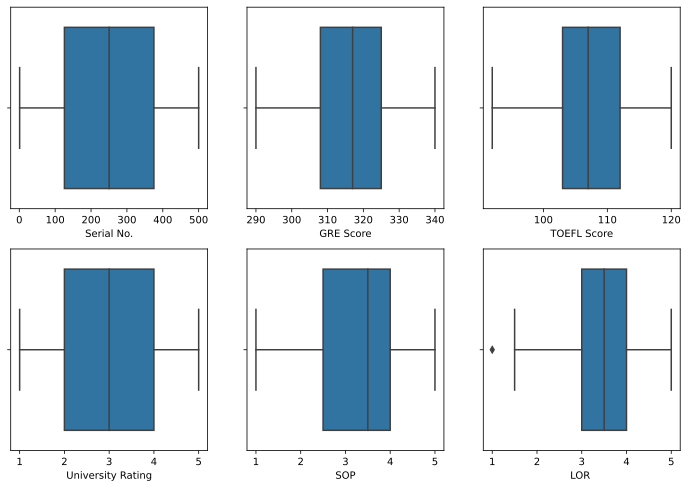

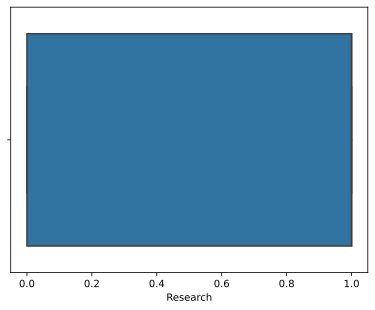

In [49]:
# plotting box plots to detect outliers in the data
fig, axis = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

index = 0
for row in range(2):
    for col in range(3):
        sns.boxplot(x=df[num_cols[index]], ax=axis[row, col])
        index += 1

plt.show()
sns.boxplot(x=df[num_cols[-1]])
plt.show()

In [57]:
X

array([[  1.  , 337.  , 118.  , ...,   4.5 ,   9.65,   1.  ],
       [  2.  , 324.  , 107.  , ...,   4.5 ,   8.87,   1.  ],
       [  3.  , 316.  , 104.  , ...,   3.5 ,   8.  ,   1.  ],
       ...,
       [498.  , 330.  , 120.  , ...,   5.  ,   9.56,   1.  ],
       [499.  , 312.  , 103.  , ...,   5.  ,   8.43,   0.  ],
       [500.  , 327.  , 113.  , ...,   4.5 ,   9.04,   0.  ]])

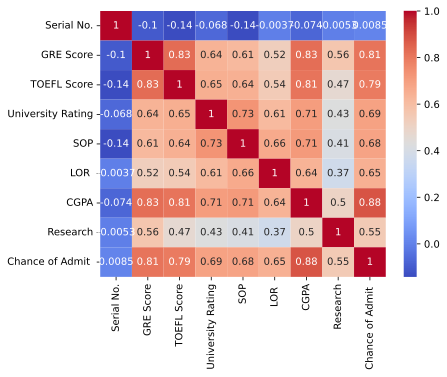

In [61]:
sns.heatmap(data=df.corr(), annot=True, cmap="coolwarm")
plt.show()

In [62]:
sns.pairplot(data=df)
plt.show()

In [63]:
df.head()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


In [68]:
df_new = df.drop(labels="Serial No.", axis=1)

In [69]:
df.columns

Index(['Serial No.', 'GRE Score', 'TOEFL Score', 'University Rating', 'SOP',
       'LOR ', 'CGPA', 'Research', 'Chance of Admit '],
      dtype='object')

In [67]:
df_new

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.5,4.5,9.65,1,0.92
1,324,107,4,4.0,4.5,8.87,1,0.76
2,316,104,3,3.0,3.5,8.00,1,0.72
3,322,110,3,3.5,2.5,8.67,1,0.80
4,314,103,2,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...
495,332,108,5,4.5,4.0,9.02,1,0.87
496,337,117,5,5.0,5.0,9.87,1,0.96
497,330,120,5,4.5,5.0,9.56,1,0.93
498,312,103,4,4.0,5.0,8.43,0,0.73


In [70]:
sns.pairplot(data=df_new)
plt.show()

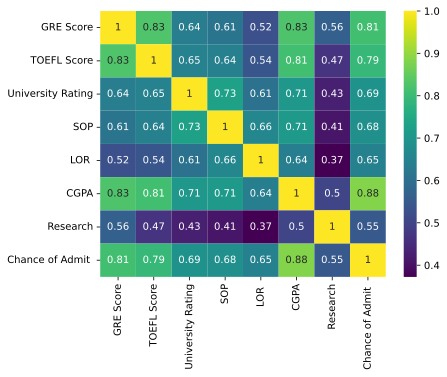

In [73]:
corrMatrix = df_new.corr()
sns.heatmap(corrMatrix, annot=True, cmap="viridis")
plt.show()

In [74]:
df_new

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.5,4.5,9.65,1,0.92
1,324,107,4,4.0,4.5,8.87,1,0.76
2,316,104,3,3.0,3.5,8.00,1,0.72
3,322,110,3,3.5,2.5,8.67,1,0.80
4,314,103,2,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...
495,332,108,5,4.5,4.0,9.02,1,0.87
496,337,117,5,5.0,5.0,9.87,1,0.96
497,330,120,5,4.5,5.0,9.56,1,0.93
498,312,103,4,4.0,5.0,8.43,0,0.73


In [75]:
from sklearn.preprocessing import StandardScaler

In [76]:
scaler = StandardScaler()

In [77]:
X = df_new.iloc[:, :8].values
y = df_new.iloc[:, -1].values

In [79]:
scaled = scaler.fit_transform(X)

In [80]:
scaled

array([[ 1.81923762,  1.77886545,  0.77558214, ...,  1.77680627,
         0.88640526,  1.40610734],
       [ 0.66714832, -0.03160087,  0.77558214, ...,  0.48585943,
         0.88640526,  0.27134907],
       [-0.0418297 , -0.52536441, -0.09979274, ..., -0.95404281,
         0.88640526, -0.0123405 ],
       ...,
       [ 1.19888185,  2.10804114,  1.65095702, ...,  1.62785086,
         0.88640526,  1.47702973],
       [-0.39631872, -0.68995225,  0.77558214, ..., -0.24236699,
        -1.12815215,  0.0585819 ],
       [ 0.93301508,  0.95592621,  0.77558214, ...,  0.76721964,
        -1.12815215,  0.83872821]])